Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


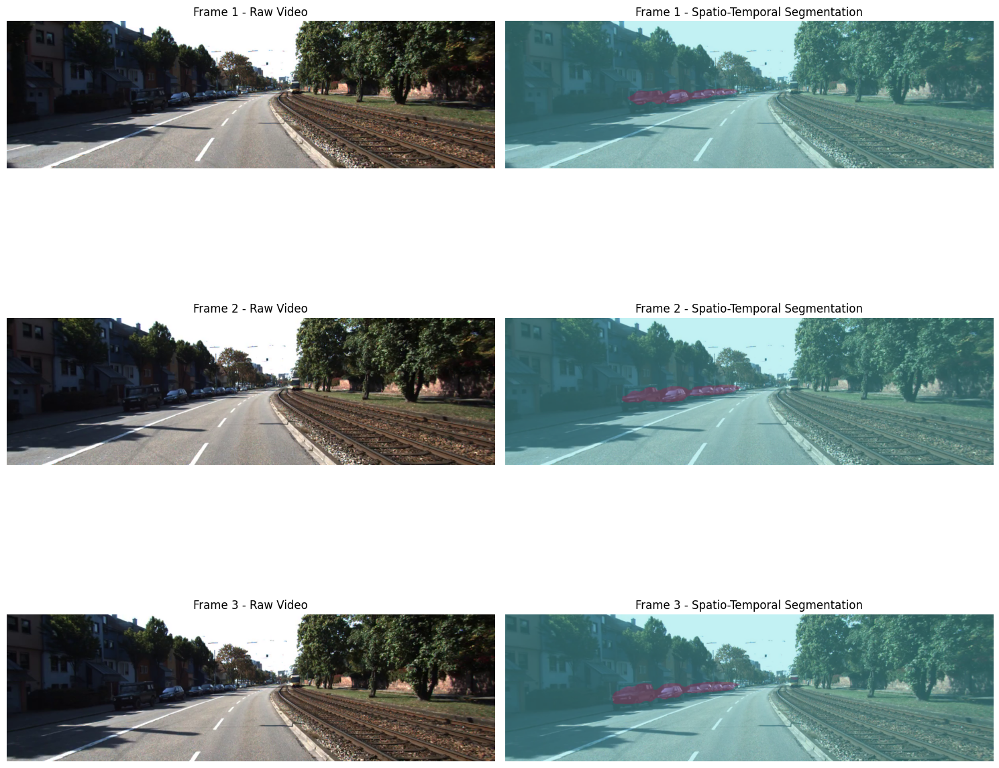

In [ ]:
import cv2
import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
from google.colab.patches import cv2_imshow

# 1. Mount Google Drive to access files
drive.mount('/content/drive')

# 2. Define video path (using the first video from your kitti_videos folder)
video_path = '/content/drive/MyDrive/kitti_videos/2011_09_26_drive_0001_sync.mp4'

# 3. Load pre-trained spatial segmentation model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = torchvision.models.segmentation.lraspp_mobilenet_v3_large(pretrained=True).eval().to(device)

# Standard ImageNet transform for model input
transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Color palette generation for class visual overlay
np.random.seed(42)
colors = np.random.randint(0, 255, size=(21, 3), dtype=np.uint8)

# 4. Process video frames
cap = cv2.VideoCapture(video_path)
frames_processed = 0
max_frames_to_show = 3  # Set number of frames to display

plt.figure(figsize=(15, 5 * max_frames_to_show))

while cap.isOpened() and frames_processed < max_frames_to_show:
    ret, frame = cap.read()
    if not ret:
        break

    # Convert BGR to RGB
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Preprocess & Predict
    input_tensor = transforms(rgb_frame).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(input_tensor)['out'][0]

    seg_mask = torch.argmax(output, dim=0).byte().cpu().numpy()

    # Create colored segmentation mask overlay
    mask_rgb = colors[seg_mask]
    overlay = cv2.addWeighted(rgb_frame, 0.6, mask_rgb, 0.4, 0)

    # 5. Display Original vs Segmented Output
    plt.subplot(max_frames_to_show, 2, frames_processed * 2 + 1)
    plt.imshow(rgb_frame)
    plt.title(f"Frame {frames_processed + 1} - Raw Video")
    plt.axis("off")

    plt.subplot(max_frames_to_show, 2, frames_processed * 2 + 2)
    plt.imshow(overlay)
    plt.title(f"Frame {frames_processed + 1} - Spatio-Temporal Segmentation")
    plt.axis("off")

    frames_processed += 1

cap.release()
plt.tight_layout()
plt.show()

Panoptic - we will use torchvision models here.




Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


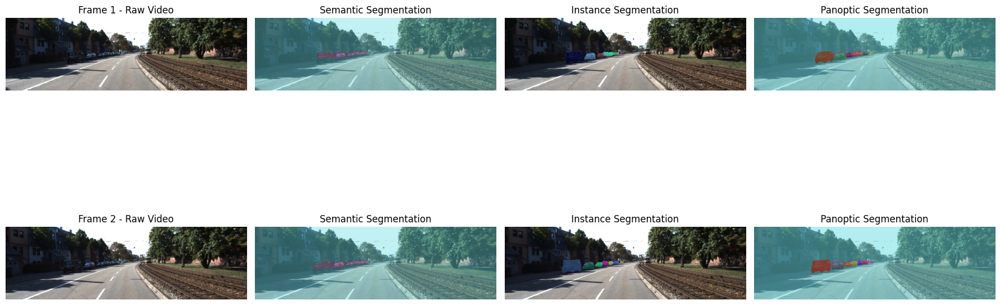

In [3]:
import cv2
import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive

# 1. Mount Google Drive
drive.mount('/content/drive')

# 2. Define Video Path
video_path = '/content/drive/MyDrive/kitti_videos/2011_09_26_drive_0001_sync.mp4'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ---------------------------------------------------------
# Load Torchvision Pre-trained Models
# ---------------------------------------------------------

# A. Semantic Segmentation (LRASPP MobileNetV3)
semantic_model = torchvision.models.segmentation.lraspp_mobilenet_v3_large(
    weights=torchvision.models.segmentation.LRASPP_MobileNet_V3_Large_Weights.DEFAULT
).eval().to(device)

# B. Instance Segmentation (Mask R-CNN)
instance_model = torchvision.models.detection.maskrcnn_resnet50_fpn(
    weights=torchvision.models.detection.MaskRCNN_ResNet50_FPN_Weights.DEFAULT
).eval().to(device)

semantic_transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

instance_transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor()
])

np.random.seed(42)
colors = np.random.randint(0, 255, size=(21, 3), dtype=np.uint8)

# ---------------------------------------------------------
# Frame-by-Frame Processing
# ---------------------------------------------------------
cap = cv2.VideoCapture(video_path)
frames_processed = 0
max_frames_to_show = 2

plt.figure(figsize=(18, 5 * max_frames_to_show))

while cap.isOpened() and frames_processed < max_frames_to_show:
    ret, frame = cap.read()
    if not ret:
        break

    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # --- 1. SEMANTIC SEGMENTATION ---
    sem_tensor = semantic_transform(rgb_frame).unsqueeze(0).to(device)
    with torch.no_grad():
        sem_out = semantic_model(sem_tensor)['out'][0]
    sem_mask = torch.argmax(sem_out, dim=0).byte().cpu().numpy()
    sem_color = colors[sem_mask]
    semantic_overlay = cv2.addWeighted(rgb_frame, 0.6, sem_color, 0.4, 0)

    # --- 2. INSTANCE SEGMENTATION ---
    inst_tensor = instance_transform(rgb_frame).unsqueeze(0).to(device)
    with torch.no_grad():
        inst_out = instance_model(inst_tensor)[0]

    instance_overlay = rgb_frame.copy()
    masks = inst_out['masks'].cpu().numpy()
    scores = inst_out['scores'].cpu().numpy()

    for i in range(len(scores)):
        if scores[i] > 0.5:
            mask = masks[i, 0] > 0.5
            color = np.random.randint(0, 255, (3,), dtype=np.uint8)
            # Blend pixels using NumPy array operations directly
            instance_overlay[mask] = (instance_overlay[mask] * 0.5 + color * 0.5).astype(np.uint8)

    # --- 3. UNIFIED PANOPTIC SEGMENTATION ---
    panoptic_overlay = sem_color.copy()
    for i in range(len(scores)):
        if scores[i] > 0.5:
            mask = masks[i, 0] > 0.5
            color = np.random.randint(50, 255, (3,), dtype=np.uint8)
            panoptic_overlay[mask] = color

    panoptic_overlay = cv2.addWeighted(rgb_frame, 0.5, panoptic_overlay, 0.5, 0)

    # --- DISPLAY SIDE-BY-SIDE ---
    row = frames_processed * 4

    plt.subplot(max_frames_to_show, 4, row + 1)
    plt.imshow(rgb_frame)
    plt.title(f"Frame {frames_processed + 1} - Raw Video")
    plt.axis("off")

    plt.subplot(max_frames_to_show, 4, row + 2)
    plt.imshow(semantic_overlay)
    plt.title("Semantic Segmentation")
    plt.axis("off")

    plt.subplot(max_frames_to_show, 4, row + 3)
    plt.imshow(instance_overlay)
    plt.title("Instance Segmentation")
    plt.axis("off")

    plt.subplot(max_frames_to_show, 4, row + 4)
    plt.imshow(panoptic_overlay)
    plt.title("Panoptic Segmentation")
    plt.axis("off")

    frames_processed += 1

cap.release()
plt.tight_layout()
plt.show()

**VIDEO**

In [4]:
import cv2
import torch
import torchvision
import numpy as np
from google.colab import drive
from IPython.display import HTML
from base64 import b64encode

# 1. Mount Google Drive
drive.mount('/content/drive')

# 2. Define Input & Output Video Paths
video_path = '/content/drive/MyDrive/kitti_videos/2011_09_26_drive_0001_sync.mp4'
output_path = 'output_comparison.mp4'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ---------------------------------------------------------
# Load Torchvision Models
# ---------------------------------------------------------
semantic_model = torchvision.models.segmentation.lraspp_mobilenet_v3_large(
    weights=torchvision.models.segmentation.LRASPP_MobileNet_V3_Large_Weights.DEFAULT
).eval().to(device)

instance_model = torchvision.models.detection.maskrcnn_resnet50_fpn(
    weights=torchvision.models.detection.MaskRCNN_ResNet50_FPN_Weights.DEFAULT
).eval().to(device)

semantic_transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

instance_transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor()
])

np.random.seed(42)
colors = np.random.randint(0, 255, size=(21, 3), dtype=np.uint8)

# ---------------------------------------------------------
# Video Processing setup
# ---------------------------------------------------------
cap = cv2.VideoCapture(video_path)
fps = int(cap.get(cv2.CAP_PROP_FPS))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Combine 4 views side-by-side (2x2 grid format)
grid_width = width * 2
grid_height = height * 2

# Video Writer setup (using mp4v format)
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (grid_width, grid_height))

print("Processing video frames...")

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # 1. SEMANTIC SEGMENTATION
    sem_tensor = semantic_transform(rgb_frame).unsqueeze(0).to(device)
    with torch.no_grad():
        sem_out = semantic_model(sem_tensor)['out'][0]
    sem_mask = torch.argmax(sem_out, dim=0).byte().cpu().numpy()
    sem_color = colors[sem_mask]
    semantic_overlay = cv2.addWeighted(rgb_frame, 0.6, sem_color, 0.4, 0)

    # 2. INSTANCE SEGMENTATION
    inst_tensor = instance_transform(rgb_frame).unsqueeze(0).to(device)
    with torch.no_grad():
        inst_out = instance_model(inst_tensor)[0]

    instance_overlay = rgb_frame.copy()
    masks = inst_out['masks'].cpu().numpy()
    scores = inst_out['scores'].cpu().numpy()

    for i in range(len(scores)):
        if scores[i] > 0.5:
            mask = masks[i, 0] > 0.5
            color = np.random.randint(0, 255, (3,), dtype=np.uint8)
            instance_overlay[mask] = (instance_overlay[mask] * 0.5 + color * 0.5).astype(np.uint8)

    # 3. PANOPTIC SEGMENTATION
    panoptic_overlay = sem_color.copy()
    for i in range(len(scores)):
        if scores[i] > 0.5:
            mask = masks[i, 0] > 0.5
            color = np.random.randint(50, 255, (3,), dtype=np.uint8)
            panoptic_overlay[mask] = color
    panoptic_overlay = cv2.addWeighted(rgb_frame, 0.5, panoptic_overlay, 0.5, 0)

    # Convert back to BGR for OpenCV VideoWriter
    raw_bgr = frame
    sem_bgr = cv2.cvtColor(semantic_overlay, cv2.COLOR_RGB2BGR)
    inst_bgr = cv2.cvtColor(instance_overlay, cv2.COLOR_RGB2BGR)
    pan_bgr = cv2.cvtColor(panoptic_overlay, cv2.COLOR_RGB2BGR)

    # Add text labels on each panel
    cv2.putText(raw_bgr, "1. Raw Video", (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    cv2.putText(sem_bgr, "2. Semantic Segmentation", (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    cv2.putText(inst_bgr, "3. Instance Segmentation", (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    cv2.putText(pan_bgr, "4. Panoptic Segmentation", (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Build 2x2 Grid Layout
    top_row = np.hstack((raw_bgr, sem_bgr))
    bottom_row = np.hstack((inst_bgr, pan_bgr))
    combined_grid = np.vstack((top_row, bottom_row))

    out.write(combined_grid)

cap.release()
out.release()
print("Video processing finished!")

# ---------------------------------------------------------
# Convert video to H.264 web format & Display in Colab
# ---------------------------------------------------------
!ffmpeg -y -i output_comparison.mp4 -vcodec libx264 web_output.mp4 -loglevel quiet

mp4 = open('web_output.mp4', 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML(f"""
<video width=800 controls autoplay loop>
      <source src="{data_url}" type="video/mp4">
</video>
""")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Processing video frames...
Video processing finished!
